#installing

```
# This is formatted as code
```

*

In [ ]:
!pip install pyswarm


  Preparing metadata (setup.py) ... done
  Created wheel for pyswarm: filename=pyswarm-0.6-py3-none-any.whl size=4464 sha256=ddfed5af8f95532e3e9b26bfbf3f900b2d2e26c8981bb8f2677fddce31dbb600
  Stored in directory: /root/.cache/pip/wheels/bb/4f/ec/8970b83323e16aa95034da175454843947376614d6d5e9627f
Successfully built pyswarm


In [ ]:
!pip install scikeras

# import libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.utils import to_categorical

from pyswarm import pso



# import data

In [ ]:
data = pd.read_csv("wine_data.csv")
data

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
0,11.6,0.580,0.66,2.20,0.074,10.0,47.0,1.00080,3.25,0.57,9.0,3
1,10.4,0.610,0.49,2.10,0.200,5.0,16.0,0.99940,3.16,0.63,8.4,3
2,7.4,1.185,0.00,4.25,0.097,5.0,14.0,0.99660,3.63,0.54,10.7,3
3,10.4,0.440,0.42,1.50,0.145,34.0,48.0,0.99832,3.38,0.86,9.9,3
4,8.3,1.020,0.02,3.40,0.084,6.0,11.0,0.99892,3.48,0.49,11.0,3
...,...,...,...,...,...,...,...,...,...,...,...,...
20995,9.7,1.020,0.91,50.00,0.412,114.6,181.7,1.02085,3.30,0.89,12.0,9
20996,10.2,0.610,0.88,53.80,0.250,62.4,204.7,1.02776,3.52,1.14,9.7,9
20997,13.4,0.460,1.04,52.10,0.449,63.0,273.5,1.02618,2.89,1.76,9.3,9
20998,6.6,1.030,1.09,25.30,0.138,179.8,295.0,1.02476,2.94,1.54,12.9,9


# data analysis

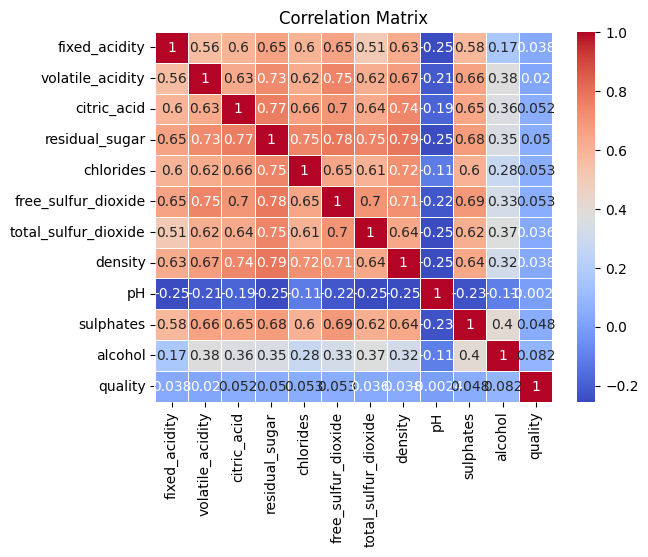

In [ ]:
columns = data.columns
correlation_matrix = data[columns].corr()

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)


plt.title('Correlation Matrix')
plt.show()

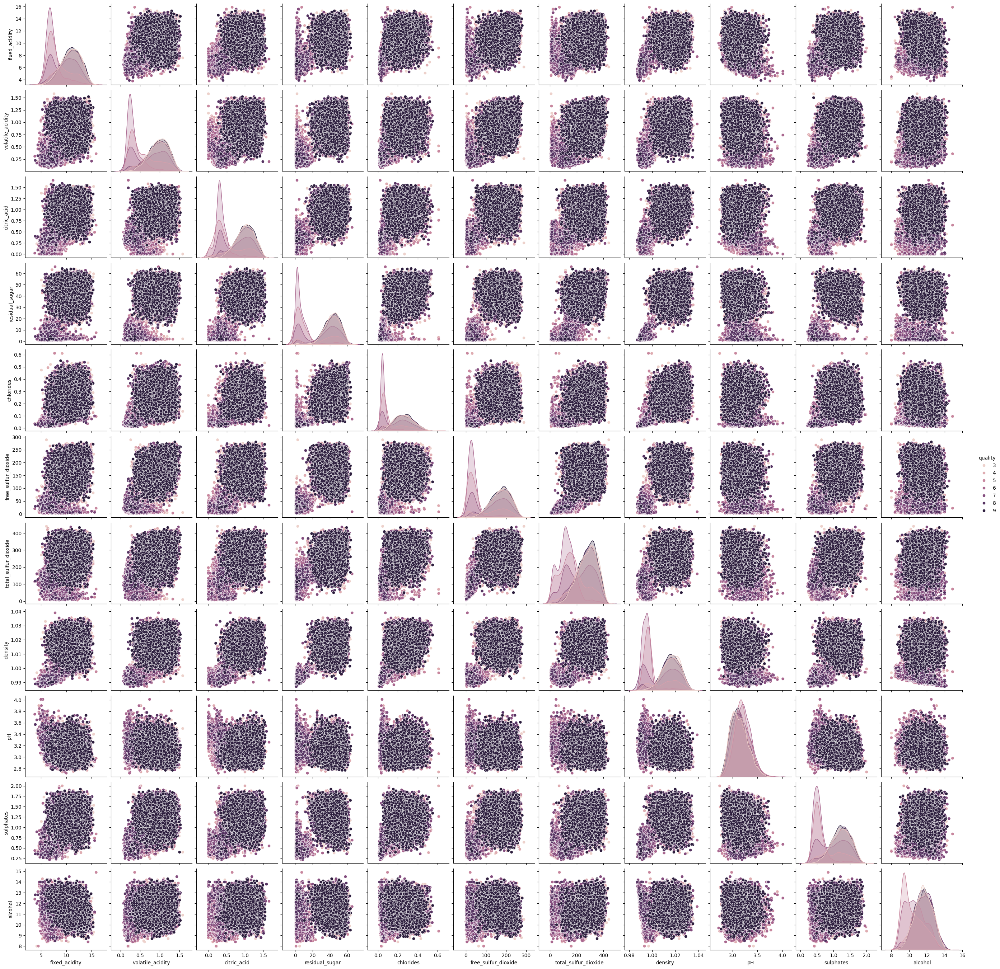

In [ ]:
_ = sns.pairplot(data, hue="quality")

# x & y

In [ ]:
x = data.drop(columns="quality")
y = data["quality"]


In [ ]:
scaler = StandardScaler() #_
x_scaled = scaler.fit_transform(x) #_

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=40)

# PCA

In [ ]:
pca = PCA(n_components=2) # Reduce to 2 components for visualization
principal_components = pca.fit_transform(x_scaled)

In [ ]:
pc_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])
pc_df = pd.concat([pc_df, y.reset_index(drop=True)], axis=1)
pc_df
pc_data = pc_df

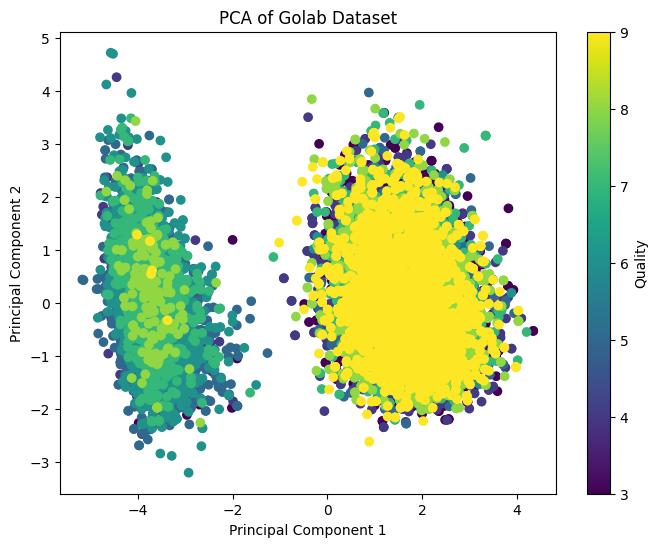

In [ ]:
plt.figure(figsize=(8, 6))
plt.scatter(pc_df['PC1'], pc_df['PC2'], c=pc_df['quality'], cmap='viridis')
plt.title('PCA of Golab Dataset')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(label='Quality')
plt.show()

In [ ]:
pc_data
pc_x = pc_data.drop(columns="quality")
pc_y = pc_data["quality"]
pc_X_train, pc_X_test, pc_y_train, pc_y_test = train_test_split(pc_x, pc_y, test_size=0.3, random_state=40)

#optimizing

In [ ]:
def create_model(hide_unite, dropout_rate, activation_function, batch_size, num_hidden_layers):
    model = Sequential()
    model.add(Dense(int(hide_unite), activation=activation_function, input_shape=(X_train.shape[1],)))
    model.add(Dropout(dropout_rate))

    for _ in range(int(num_hidden_layers) - 1):
        model.add(Dense(int(hide_unite), activation=activation_function))
        model.add(Dropout(dropout_rate))

    model.add(Dense(9, activation='softmax'))
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

In [ ]:
def evaluate(params):
    hide_unite, dropout_rate, activation_index, batch_size, num_hidden_layers = params

    activation_functions = ['relu', 'tanh', 'sigmoid']
    activation_function = activation_functions[int(activation_index)]

    model = create_model(hide_unite, dropout_rate, activation_function, batch_size, num_hidden_layers)

    y_train_encoded = to_categorical(y_train - 1, num_classes=9)
    y_test_encoded = to_categorical(y_test - 1, num_classes=9)

    model.fit(X_train, y_train_encoded, epochs=256, batch_size=int(batch_size), verbose=0)
    accuracy = model.evaluate(X_test, y_test_encoded, verbose=0)[1]
    return -accuracy

In [ ]:
bounds = [(32, 128), (0.1, 0.5), (0, 2), (32, 256), (1, 6)]
best_params, best_score = pso(evaluate, lb=[b[0] for b in bounds], ub=[b[1] for b in bounds], swarmsize=40, maxiter=25)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/lo

Stopping search: maximum iterations reached --> 25


In [ ]:
print(f'Best Parameters: {best_params}')
print(f'Best Accuracy: {-best_score}')


Best Parameters: [94.00681043  0.26040785  1.64302841 83.11495645  1.49823303]
Best Accuracy: 0.31380951404571533
